# Analysis of extrinsic results

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pickle
import json
import pandas as pd
import seaborn as sns
import plotly.express as px
import numpy as np
from scipy import stats
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import lisa_cluster

from src import plotting_functions as plot_func
from src import evaluation_functions as eval_func

%run ../settings/yaml_variables.py
%run ../settings/df_styler.py
%run ../settings/plotting.py
%run ../settings/paths.py

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/explore/segregation/network/network.py:15: UserWarning: You need pandana and urbanaccess to work with segregation's network module
You can install them with  `pip install urbanaccess pandana` or `conda install -c udst pandana urbanaccess`
  warn(
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql
<string>:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
/Users/anev/Library/CloudStorage/Dropbox/ITU/repositories/bikedna_dk_analysis/settings/plotting.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases 

In [2]:
# Import summary dataframe
summarize_ex_results_df = pd.read_csv(f"../results/COMPARE/{study_area}/data/extrinsic_summary_results.csv",index_col=0)

summarize_ex_results_df.style.pipe(format_extrinsic_style)

,OSM,GeoDanmark
Total infrastructure length (km),"20,619","8,676"
Protected bicycle infrastructure density (m/km2),383,92
Unprotected bicycle infrastructure density (m/km2),61,95
Mixed protection bicycle infrastructure density (m/km2),1,0
Bicycle infrastructure density (m/km2),445,187
Nodes,"90,419","51,224"
Dangling nodes,"46,344","11,218"
Nodes per km2,2,1
Dangling nodes per km2,1,0
Overshoots,92,99


In [3]:
# Import summary dataframe
summarize_fm_results_df = pd.read_csv(
    f"../results/COMPARE/{study_area}/data/feature_matching_summary_stats.csv",
    index_col=0,
)

summarize_fm_results_df.style.pipe(format_matched_style)


,OSM,GeoDanmark
Count of matched edges,"17,014","32,055"
Percent matched edges,19%,63%
Length of matched edges (km),"3,515","5,600"
Percent of matched network length,23%,65%
Local min of % matched edges,1%,2%
Local max of % matched edges,100%,100%
Local average of % matched edges,53%,88%


In [4]:

# TODO: zoomed in plots of fm matching vs. pop density

# **** 


# TODO: Analysis of correlation between high/low quality areas and pop density

# TODO: Make plotting optional?

In [5]:
make_plots = True

## Spatial patterns in density differences

In [6]:
# Read extrinsic grid results
with open(
    compare_results_data_fp + f"grid_results_extrinsic.pickle", "rb"
) as fp:
    extrinsic_grid = pickle.load(fp)

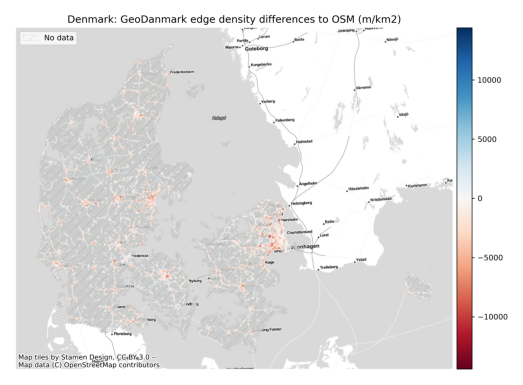

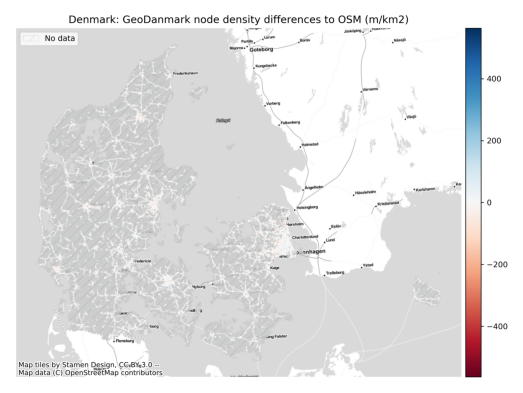

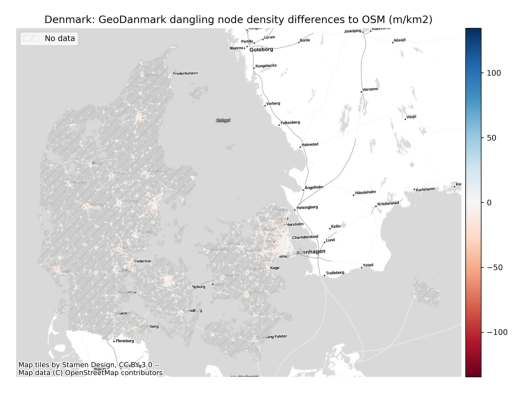

In [7]:
filepaths = [
    compare_results_static_maps_fp + "edge_density_compare",
    compare_results_static_maps_fp + "node_density_compare",
    compare_results_static_maps_fp + "dangling_node_density_compare",
]

for f in filepaths:

    plot_func.plot_saved_maps(filepaths=[f])

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 24 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)


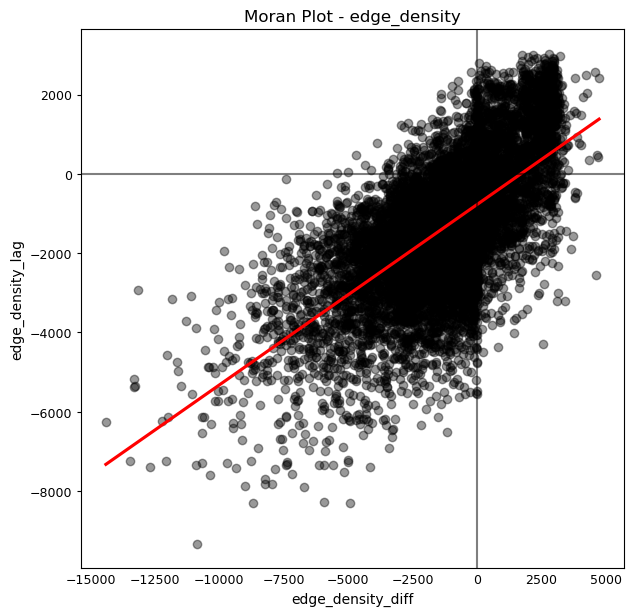

With significance 0.001, the Moran's I value for edge_density is 0.45


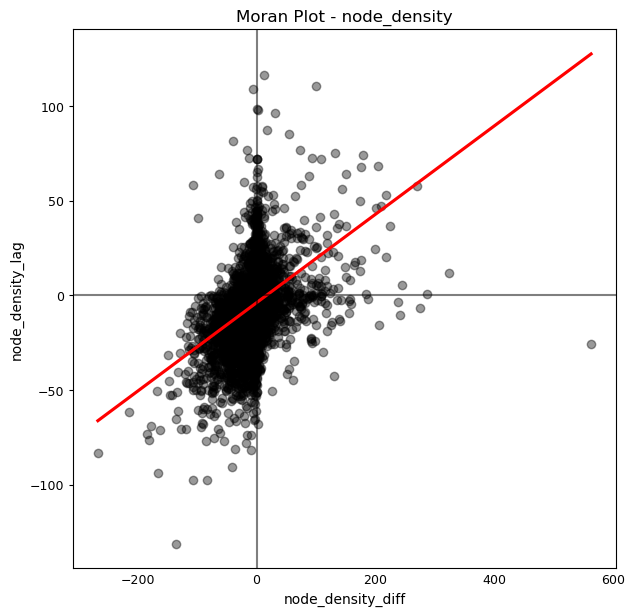

With significance 0.001, the Moran's I value for node_density is 0.23


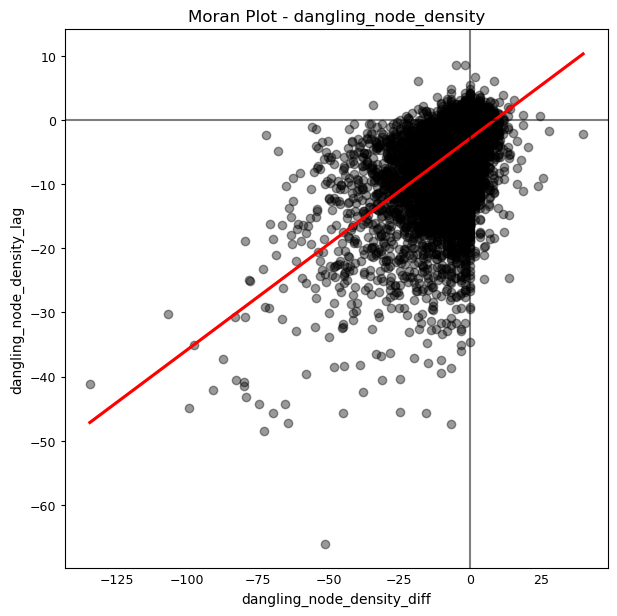

With significance 0.001, the Moran's I value for dangling_node_density is 0.33


In [8]:
col_names = ['edge_density_diff','node_density_diff','dangling_node_density_diff']
variable_names = ["edge_density","node_density","dangling_node_density"]
filepaths = [compare_analysis_plots_fp+"morans_edge_dens.png", compare_analysis_plots_fp+"morans_node_dens.png", compare_analysis_plots_fp+"morans_dangling_dens.png"]

ex_grid_subset = extrinsic_grid.loc[(~extrinsic_grid.count_osm_edges.isna()) | (~extrinsic_grid.count_ref_edges.isna())].copy()

w = eval_func.compute_spatial_weights(ex_grid_subset, "hex_id_osm", "knn") # using filler col for subset

morans_density = eval_func.compute_spatial_autocorrelation(col_names, variable_names, ex_grid_subset, w, filepaths)

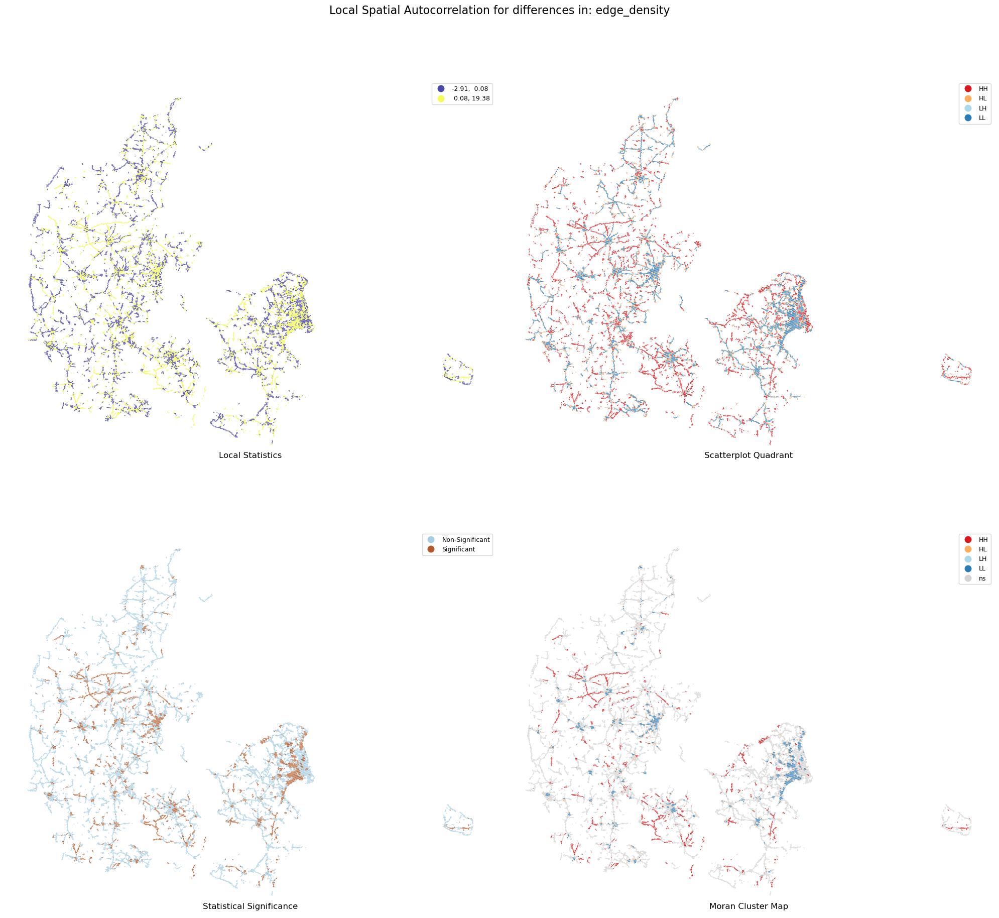

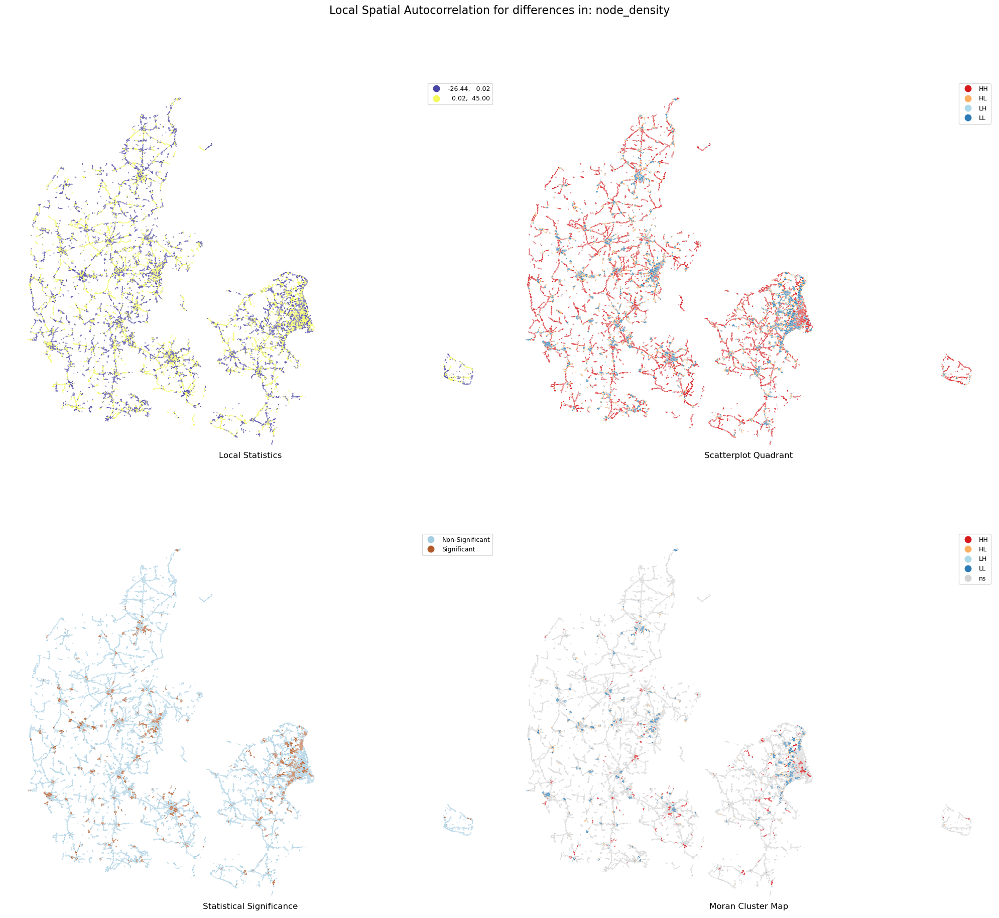

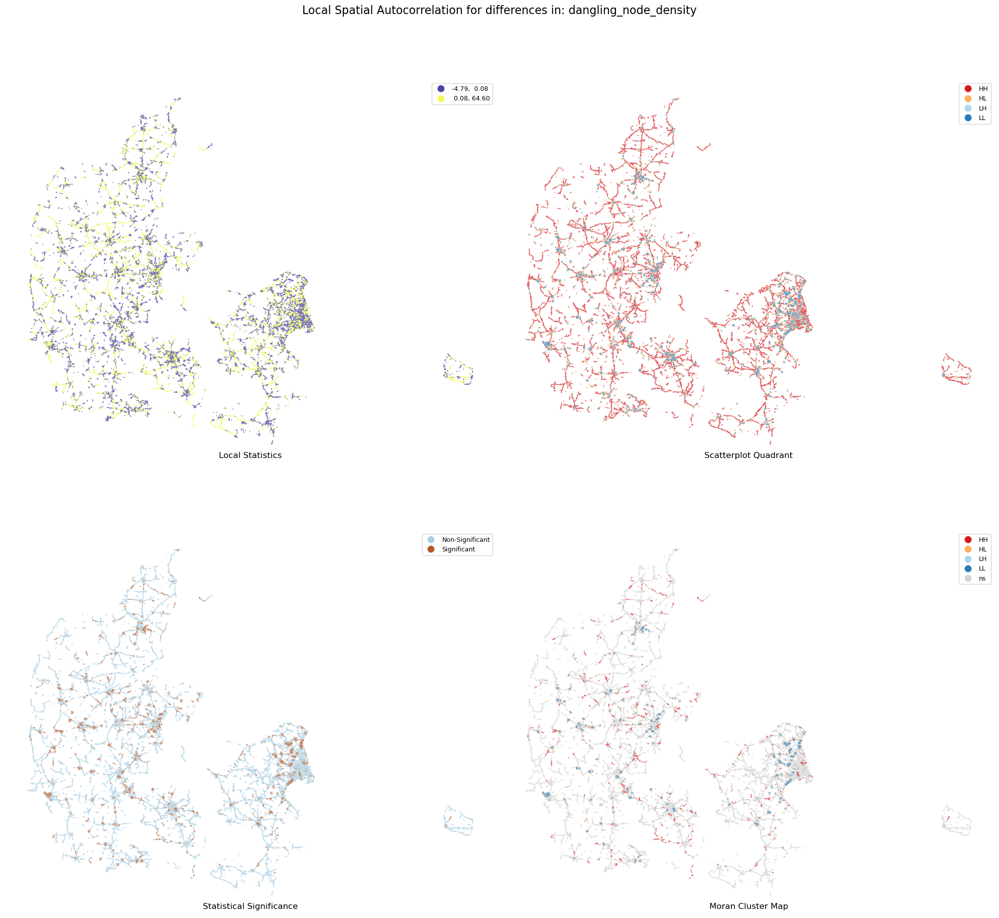

In [9]:
col_names = ['edge_density_diff','node_density_diff','dangling_node_density_diff']
variable_names = ["edge_density","node_density","dangling_node_density"]
filepaths = [compare_analysis_plots_fp+"lisa_edge_dens.png", compare_analysis_plots_fp+"lisa_node_dens.png", compare_analysis_plots_fp+"lisa_dangling_dens.png"]

lisas_density = eval_func.compute_lisa(col_names, variable_names, ex_grid_subset, w,filepaths)

In [10]:
# Export
q_cols = [v+'_q' for v in variable_names]
q_cols.append("hex_id")
ex_grid_subset.rename({"hex_id_osm":"hex_id"},axis=1)[q_cols].to_csv(compare_analysis_data_fp + "density_spatial_autocorrelation.csv",index=True)

for v in variable_names:
    hotspot = len(ex_grid_subset[ex_grid_subset[f"{v}_q"]=="HH"])
    coldspot = len(ex_grid_subset[ex_grid_subset[f"{v}_q"]=="LL"])

    print(f"For '{v}', {hotspot} out of {len(ex_grid_subset)} grid cells ({hotspot/len(ex_grid_subset)*100:.2f}%) are part of a hotspot.")
    print(f"For '{v}', {coldspot} out of {len(ex_grid_subset)} grid cells ({coldspot/len(ex_grid_subset)*100:.2f}%) are part of a coldspot.")
    print("\n")

For 'edge_density', 1910 out of 16023 grid cells (11.92%) are part of a hotspot.
For 'edge_density', 1605 out of 16023 grid cells (10.02%) are part of a coldspot.


For 'node_density', 607 out of 16023 grid cells (3.79%) are part of a hotspot.
For 'node_density', 1147 out of 16023 grid cells (7.16%) are part of a coldspot.


For 'dangling_node_density', 1189 out of 16023 grid cells (7.42%) are part of a hotspot.
For 'dangling_node_density', 1084 out of 16023 grid cells (6.77%) are part of a coldspot.




## Spatial patterns in matching success

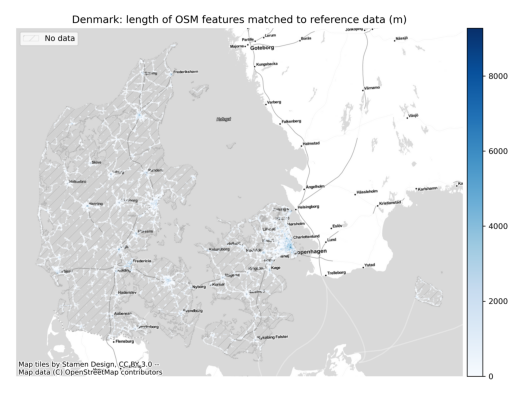

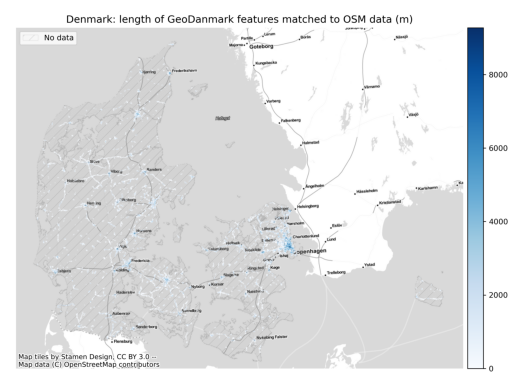

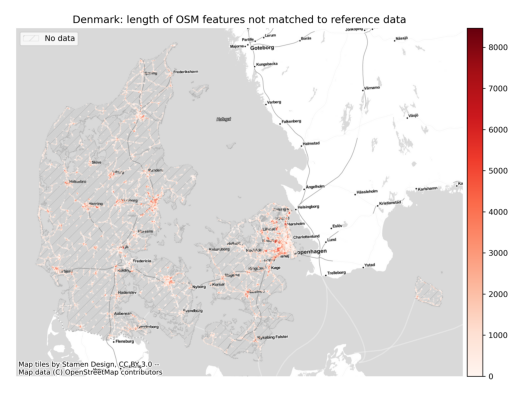

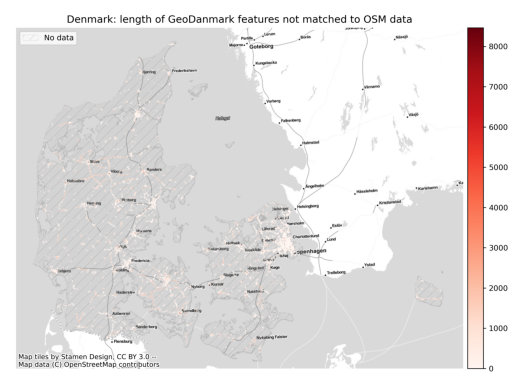

In [11]:
fm_grid = gpd.read_parquet(compare_results_data_fp + f"grid_results_feature_matching_15_17_30.parquet")

filepaths = [
    compare_results_static_maps_fp + "length_osm_matched_grid_15_17_30_compare",
    compare_results_static_maps_fp + "length_ref_matched_grid_15_17_30_compare",
    compare_results_static_maps_fp + "length_osm_unmatched_grid_15_17_30_compare",
    compare_results_static_maps_fp + "length_ref_unmatched_grid_15_17_30_compare",
]

for f in filepaths:

    plot_func.plot_saved_maps(filepaths=[f])

### OSM

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 22 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)


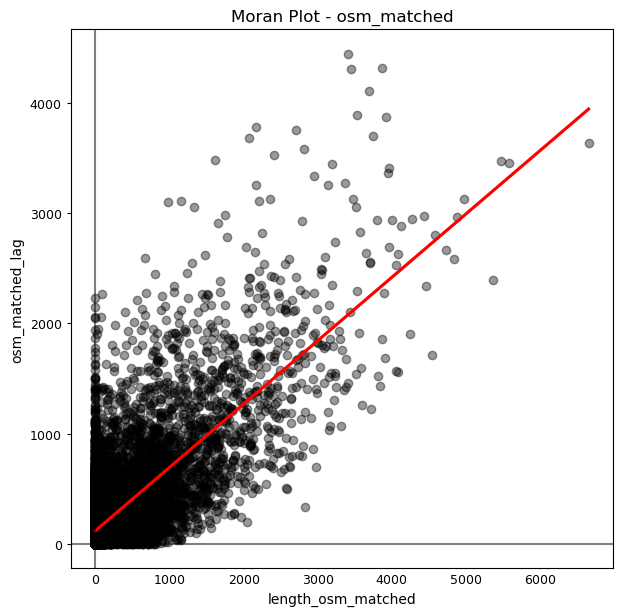

With significance 0.001, the Moran's I value for osm_matched is 0.57


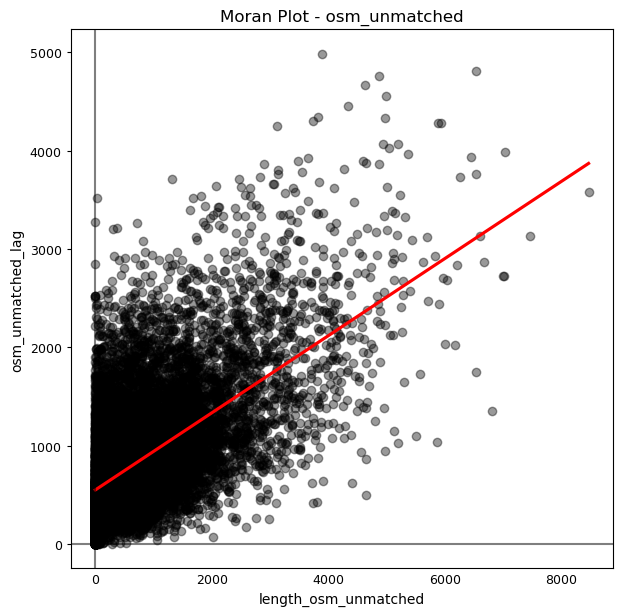

With significance 0.001, the Moran's I value for osm_unmatched is 0.39


In [12]:
osm_col_names = ['length_osm_matched','length_osm_unmatched']
osm_variable_names = ["osm_matched","osm_unmatched"]

filepaths = [compare_analysis_plots_fp+"morans_osm_matched.png", compare_analysis_plots_fp+"morans_osm_unmatched.png"]

fm_grid_osm_subset = fm_grid.loc[(~extrinsic_grid.count_osm_edges.isna())].copy()

w_osm = eval_func.compute_spatial_weights(fm_grid_osm_subset, "grid_id", "knn")

morans_osm_matched = eval_func.compute_spatial_autocorrelation(osm_col_names, osm_variable_names, fm_grid_osm_subset, w_osm, filepaths)

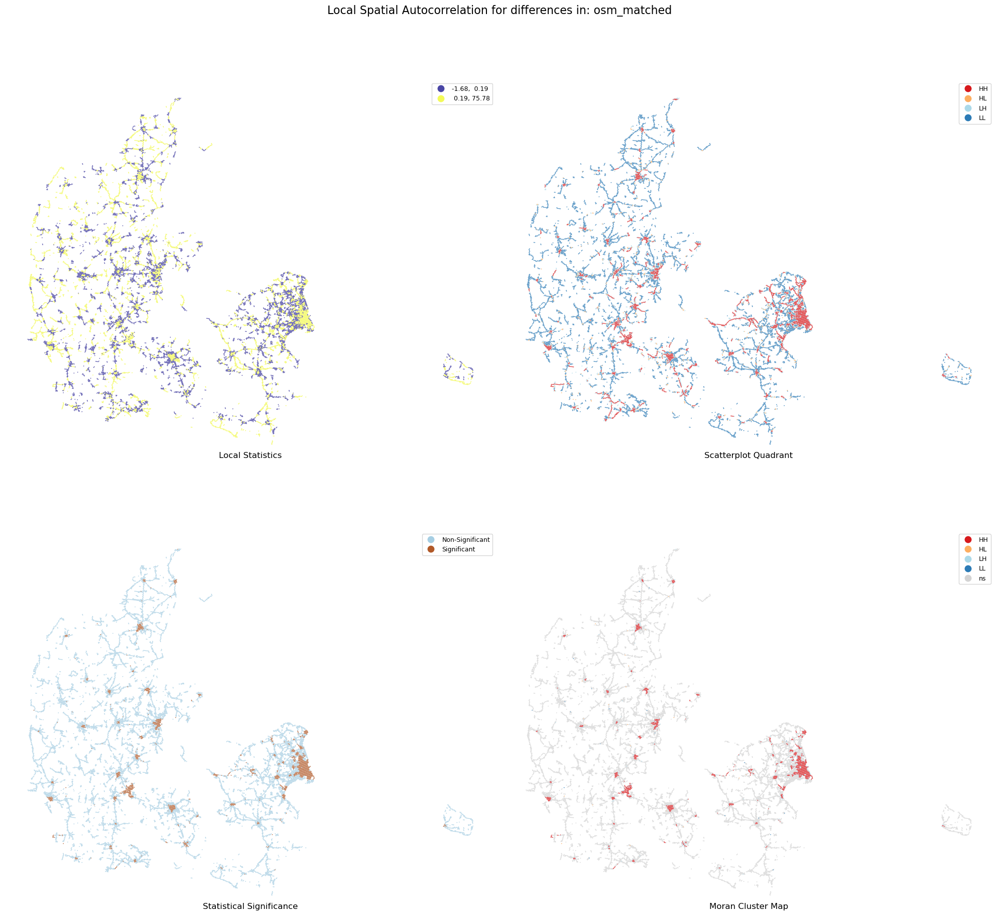

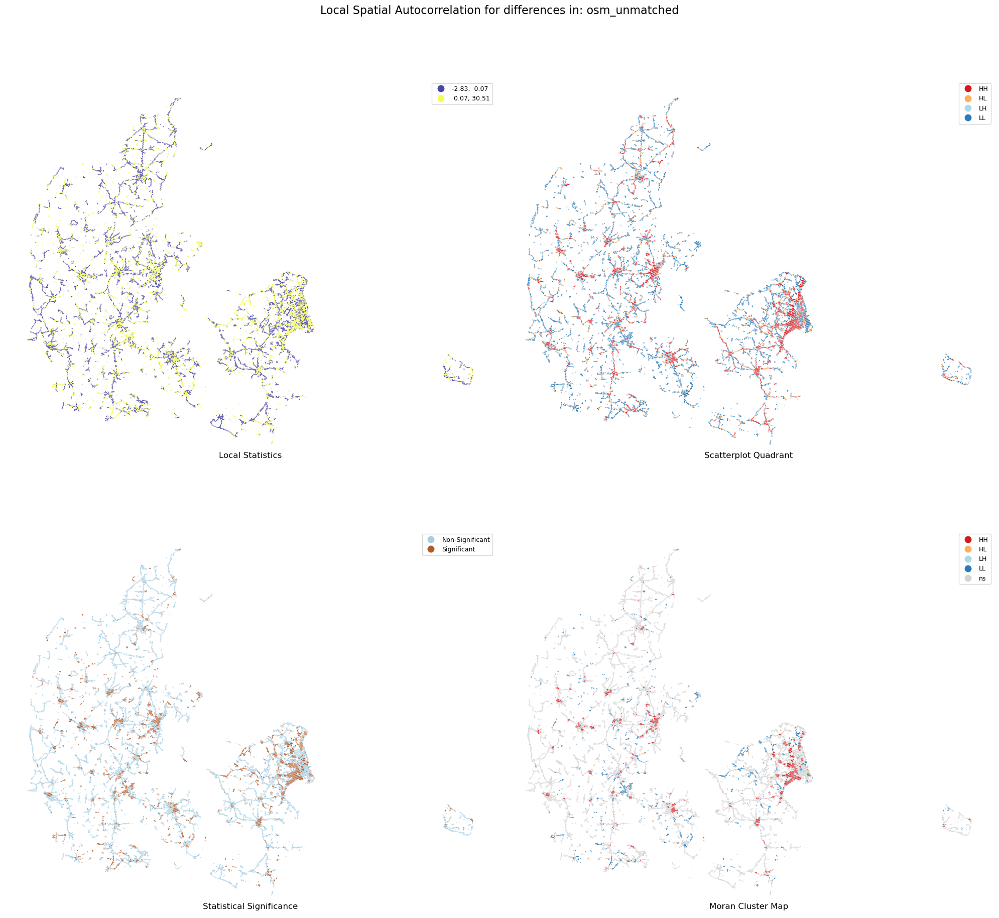

In [13]:
filepaths = [compare_analysis_plots_fp+"lisa_osm_matched.png", compare_analysis_plots_fp+"lisa_osm_unmatched.png"]

lisas_density = eval_func.compute_lisa(osm_col_names, osm_variable_names, fm_grid_osm_subset, w_osm,filepaths)

In [14]:
# Export
q_cols = [v+'_q' for v in osm_variable_names]
q_cols.append("hex_id")
fm_grid_osm_subset.rename({"hex_id_osm":"hex_id"},axis=1)[q_cols].to_csv(compare_analysis_data_fp + "osm_fm_spatial_autocorrelation.csv",index=True)

for v in osm_variable_names:
    hotspot = len(fm_grid_osm_subset[fm_grid_osm_subset[f"{v}_q"]=="HH"])
    coldspot = len(fm_grid_osm_subset[fm_grid_osm_subset[f"{v}_q"]=="LL"])

    print(f"For '{v}', {hotspot} out of {len(fm_grid_osm_subset)} grid cells ({hotspot/len(fm_grid_osm_subset)*100:.2f}%) are part of a hotspot.")
    print(f"For '{v}', {coldspot} out of {len(fm_grid_osm_subset)} grid cells ({coldspot/len(fm_grid_osm_subset)*100:.2f}%) are part of a coldspot.")
    print("\n")

For 'osm_matched', 1174 out of 14480 grid cells (8.11%) are part of a hotspot.
For 'osm_matched', 20 out of 14480 grid cells (0.14%) are part of a coldspot.


For 'osm_unmatched', 1312 out of 14480 grid cells (9.06%) are part of a hotspot.
For 'osm_unmatched', 1366 out of 14480 grid cells (9.43%) are part of a coldspot.




### GeoDanmark

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 32 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)


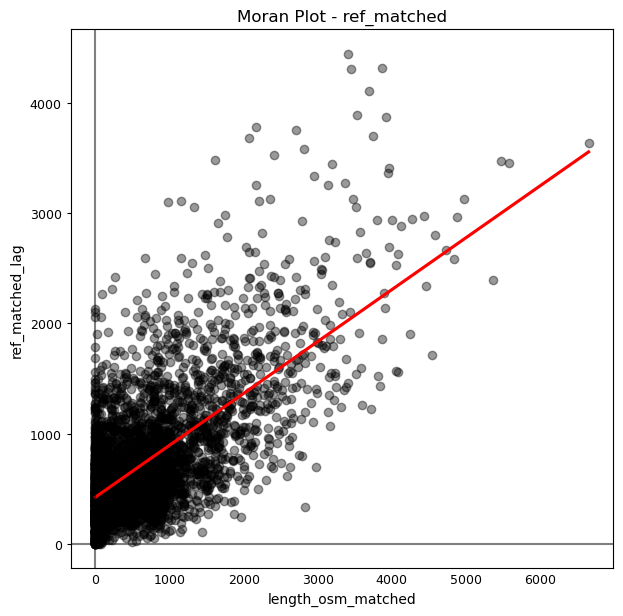

With significance 0.001, the Moran's I value for ref_matched is nan


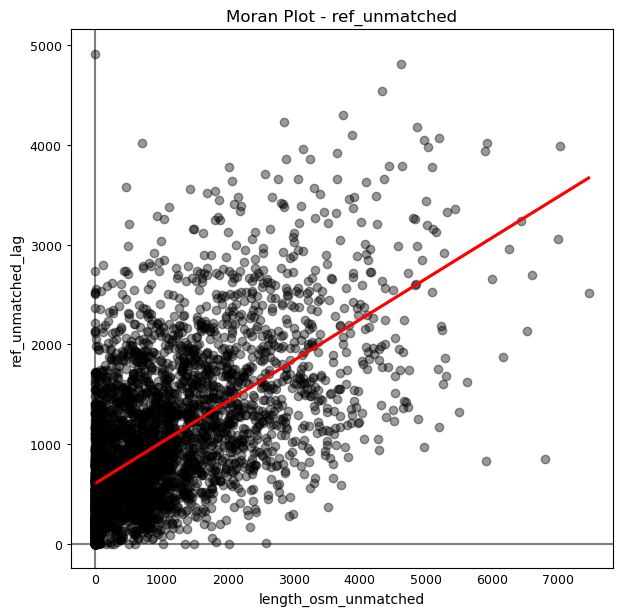

With significance 0.001, the Moran's I value for ref_unmatched is nan


In [15]:
ref_col_names = ['length_ref_matched','length_ref_unmatched']
ref_variable_names = ["ref_matched","ref_unmatched"]

filepaths = [compare_analysis_plots_fp+"morans_ref_matched.png", compare_analysis_plots_fp+"morans_ref_unmatched.png"]

fm_grid_ref_subset = fm_grid.loc[(~fm_grid.count_ref_edges.isna())].copy()

w_ref = eval_func.compute_spatial_weights(fm_grid_ref_subset, "grid_id", "knn")

morans_ref_matched = eval_func.compute_spatial_autocorrelation(osm_col_names, ref_variable_names, fm_grid_ref_subset, w_ref, filepaths)

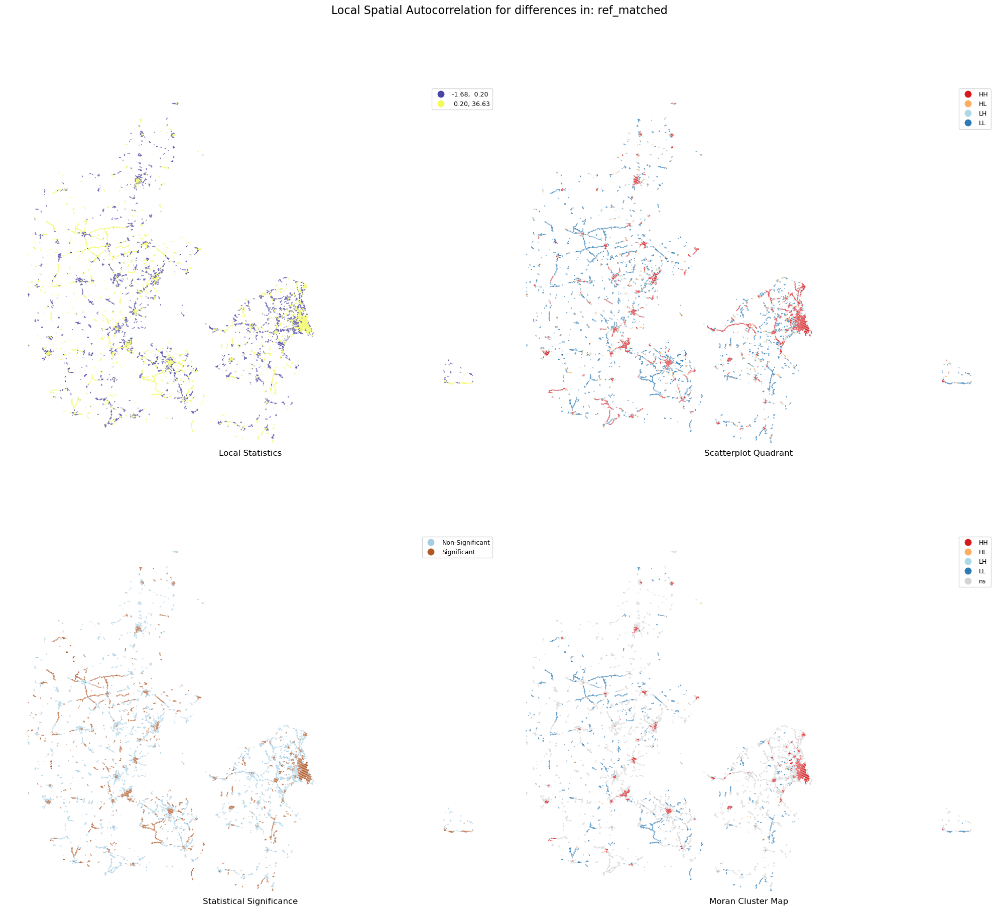

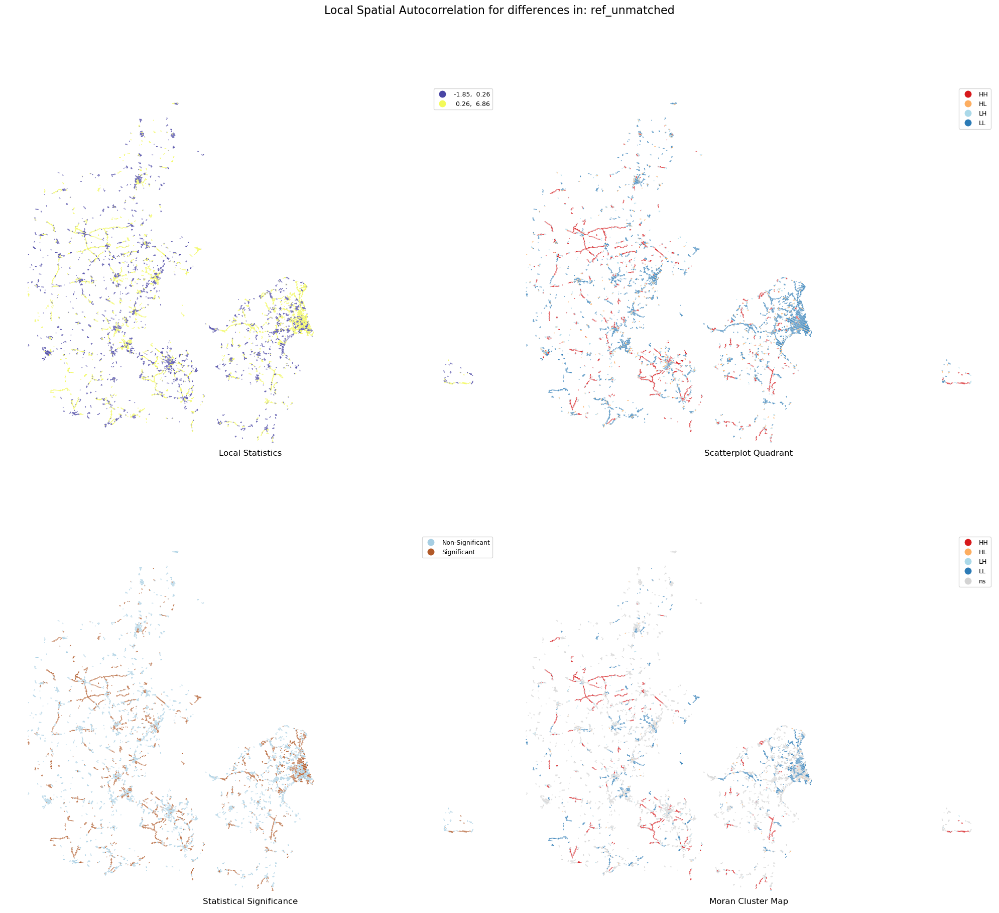

In [16]:
filepaths = [compare_analysis_plots_fp+"lisa_ref_matched.png", compare_analysis_plots_fp+"lisa_ref_unmatched.png"]

lisas_density = eval_func.compute_lisa(ref_col_names, ref_variable_names, fm_grid_ref_subset, w_ref,filepaths)

In [17]:
# Export
q_cols = [v+'_q' for v in ref_variable_names]
q_cols.append("hex_id")
fm_grid_ref_subset.rename({"hex_id_osm":"hex_id"},axis=1)[q_cols].to_csv(compare_analysis_data_fp + "ref_fm_spatial_autocorrelation.csv",index=True)

for v in ref_variable_names:
    hotspot = len(fm_grid_ref_subset[fm_grid_ref_subset[f"{v}_q"]=="HH"])
    coldspot = len(fm_grid_ref_subset[fm_grid_ref_subset[f"{v}_q"]=="LL"])

    print(f"For '{v}', {hotspot} out of {len(fm_grid_ref_subset)} grid cells ({hotspot/len(fm_grid_ref_subset)*100:.2f}%) are part of a hotspot.")
    print(f"For '{v}', {coldspot} out of {len(fm_grid_ref_subset)} grid cells ({coldspot/len(fm_grid_ref_subset)*100:.2f}%) are part of a coldspot.")
    print("\n")

For 'ref_matched', 824 out of 7413 grid cells (11.12%) are part of a hotspot.
For 'ref_matched', 1568 out of 7413 grid cells (21.15%) are part of a coldspot.


For 'ref_unmatched', 984 out of 7413 grid cells (13.27%) are part of a hotspot.
For 'ref_unmatched', 1505 out of 7413 grid cells (20.30%) are part of a coldspot.




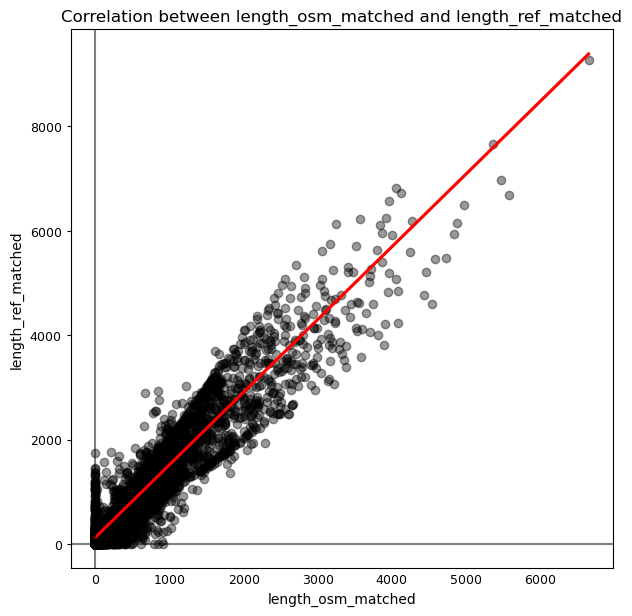

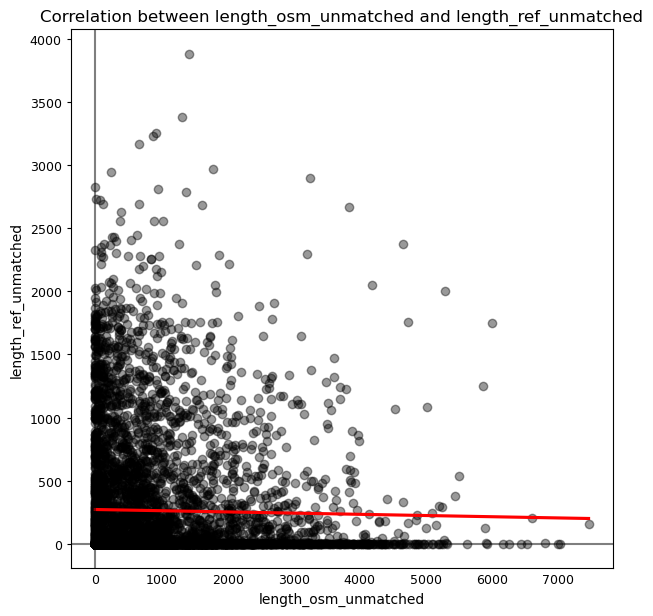

In [18]:
for o, r in zip(osm_col_names,ref_col_names):
    f, ax = plt.subplots(1, figsize=(7,7))

    sns.regplot(
        x=o,
        y=r,
        ci=None,
        data=fm_grid,
        line_kws={"color": "r"},
        scatter_kws={"alpha": 0.4},
        color="black",
    )

    ax.axvline(0, c="k", alpha=0.5)
    ax.axhline(0, c="k", alpha=0.5)
    ax.set_title(f"Correlation between {o} and {r}")
    plt.show()

## Differences between density and matching differences

In [44]:
fm_cols= ['grid_id','count_osm_matched', 'length_osm_matched',
       'count_ref_matched', 'length_ref_matched','pct_matched_osm', 'pct_matched_ref', 'count_osm_unmatched',
       'count_ref_unmatched', 'length_osm_unmatched', 'length_ref_unmatched',
       'pct_unmatched_osm', 'pct_unmatched_ref']

joined_grid = extrinsic_grid.merge(fm_grid[fm_cols],on="grid_id", how="inner")

assert len(joined_grid) == len(extrinsic_grid)

grid_subset = joined_grid[(~joined_grid.count_osm_edges.isna()) & (~joined_grid.count_ref_edges.isna())]

In [91]:
col_names = [
    "length_osm_matched",
    "length_osm_unmatched",
    "length_ref_matched",
    "length_ref_unmatched",
]

color_cols = [
    "osm_edge_density",
    "osm_edge_density",
    "ref_edge_density",
    "ref_edge_density",
]

labels={
        "osm_edge_density": "OSM edge density m/sqkm",
        "ref_edge_density": "reference edge density m/sqkm",
        "edge_density_diff": "differences in edge density (ref - OSM)",
        "length_osm_matched": "length of matched OSM features",
        "length_osm_unmatched": "length of unmatched OSM features",
        "length_ref_matched": "length of matched reference features",
        "length_ref_unmatched": "length of unmatched reference features",
        }

for i, c in enumerate(col_names):
    fig = px.scatter(
        grid_subset,
        x="edge_density_diff",
        y=c,
        color=color_cols[i],
        title=f"Correlation between edge density difference and {labels[c]}",
        hover_data=["grid_id"],
        color_continuous_scale="viridis_r",
        labels=labels
    )

    fig.update_layout(font=dict(size=12, color="RebeccaPurple"))
    fig.show()


In [94]:
grid_subset.loc[(grid_subset.edge_density_diff>4617)&(grid_subset.edge_density_diff<4618)]

,hex_id_osm,geometry,grid_id,count_osm_edges,count_osm_nodes,count_osm_simplified_edges,count_osm_simplified_nodes,osm_edge_density,osm_node_density,osm_dangling_node_density,...,count_ref_matched,length_ref_matched,pct_matched_osm,pct_matched_ref,count_osm_unmatched,count_ref_unmatched,length_osm_unmatched,length_ref_unmatched,pct_unmatched_osm,pct_unmatched_ref
41261,881f262b6bfffff,"POLYGON ((524364.493 6257099.598, 524240.734 6...",881f262b6bfffff,113.0,114.0,59.0,60.0,3536.430314,103.100832,27.493555,...,14.0,865.503125,44.067797,29.166667,33.0,34.0,1409.952907,3879.753714,55.932203,70.833333


In [93]:
grid_subset.loc[(grid_subset.edge_density_diff<-4570.7)&(grid_subset.edge_density_diff>-4570.8)]

,hex_id_osm,geometry,grid_id,count_osm_edges,count_osm_nodes,count_osm_simplified_edges,count_osm_simplified_nodes,osm_edge_density,osm_node_density,osm_dangling_node_density,...,count_ref_matched,length_ref_matched,pct_matched_osm,pct_matched_ref,count_osm_unmatched,count_ref_unmatched,length_osm_unmatched,length_ref_unmatched,pct_unmatched_osm,pct_unmatched_ref
74817,881f237467fffff,"POLYGON ((690699.862 6194040.337, 690579.926 6...",881f237467fffff,207.0,201.0,73.0,67.0,8522.31746,111.301634,53.158989,...,0.0,0.0,2.739726,0.0,71.0,5.0,4659.786191,2378.714475,97.260274,100.0


In [86]:
grid_subset.loc[(grid_subset.edge_density_diff>46.739)&(grid_subset.edge_density_diff<46.794)]

,hex_id_osm,geometry,grid_id,count_osm_edges,count_osm_nodes,count_osm_simplified_edges,count_osm_simplified_nodes,osm_edge_density,osm_node_density,osm_dangling_node_density,...,count_ref_matched,length_ref_matched,pct_matched_osm,pct_matched_ref,count_osm_unmatched,count_ref_unmatched,length_osm_unmatched,length_ref_unmatched,pct_unmatched_osm,pct_unmatched_ref
55595,881f358463fffff,"POLYGON ((453153.236 6217051.714, 453027.184 6...",881f358463fffff,97.0,92.0,25.0,20.0,8106.861758,34.318126,15.443157,...,10.0,1780.952759,20.0,31.25,20.0,22.0,1777.15763,2970.822506,80.0,68.75


In [72]:
grid_subset.loc[(grid_subset.edge_density_diff>107)&(grid_subset.edge_density_diff<107.5)]

,hex_id_osm,geometry,grid_id,count_osm_edges,count_osm_nodes,count_osm_simplified_edges,count_osm_simplified_nodes,osm_edge_density,osm_node_density,osm_dangling_node_density,...,count_ref_matched,length_ref_matched,pct_matched_osm,pct_matched_ref,count_osm_unmatched,count_ref_unmatched,length_osm_unmatched,length_ref_unmatched,pct_unmatched_osm,pct_unmatched_ref
12306,881f2299c5fffff,"POLYGON ((533886.483 6227161.944, 533762.670 6...",881f2299c5fffff,139.0,138.0,22.0,21.0,8720.271924,35.785804,22.153117,...,37.0,2283.074112,36.363636,56.060606,14.0,29.0,3248.802773,2897.004552,63.636364,43.939394
